# Particle Cloud Simulation


This notebook uses the same setup as `detailed_look.jl` / `example2()`.
For additional documentation e.g. see :
[1](https://JuliaClimate.github.io/IndividualDisplacements.jl/dev/),
[2](https://JuliaClimate.github.io/MeshArrays.jl/dev/),
[3](https://docs.juliadiffeq.org/latest/solvers/ode_solve.html),
[4](https://en.wikipedia.org/wiki/Displacement_(vector))

## 1. Import Software

In [1]:
using IndividualDisplacements, OrdinaryDiffEq, Statistics
p=dirname(pathof(IndividualDisplacements))
include(joinpath(p,"../examples/recipes_plots.jl"))
include(joinpath(p,"../examples/example123.jl"))

Main.##384.example3_setup

## 2. Setup Problem

In [2]:
uvetc=example2_setup()

#ii1=1:10:80; ii2=1:10:42; #->sol is (2, 40, 40065)
#ii1=30:37; ii2=16:20; #->sol is (2, 40, 9674)
#ii1=10:17; ii2=16:20; #->sol is (2, 40, 51709)
ii1=5:5:40; ii2=5:5:25; #->sol is (2, 40, 51709)

n1=length(ii1); n2=length(ii2);
u0=Array{Float64,2}(undef,(2,n1*n2))
for i1 in eachindex(ii1); for i2 in eachindex(ii2);
        i=i1+(i2-1)*n1
        u0[1,i]=ii1[i1]-0.5
        u0[2,i]=ii2[i2]-0.5
end; end;

## 3. Compute Trajectories

- Define an ODE problem.
- Solve the ODE problem to compute trajectories.

In [3]:
𝑇 = (0.0,2998.0*3600.0)
prob = ODEProblem(⬡,u0,𝑇,uvetc)

sol = solve(prob,Tsit5(),reltol=1e-6,abstol=1e-6)
size(sol)

(2, 40, 7157)

## 4. Display results

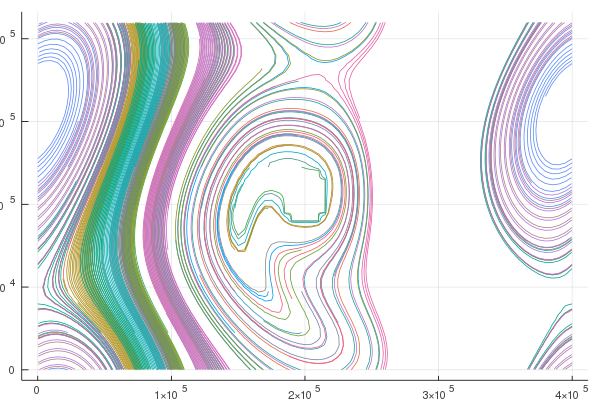

In [4]:
ID=collect(1:size(sol,2))*ones(1,size(sol,3))
lon=5000* mod.(sol[1,:,:],80); lat=5000* mod.(sol[2,:,:],42)
df = DataFrame(ID=Int.(ID[:]), lon=lon[:], lat=lat[:])
plt=PlotBasic(df,size(sol,2),100000.0)

Compare with trajectory output from `MITgcm`

# floats=300
# steps=3000


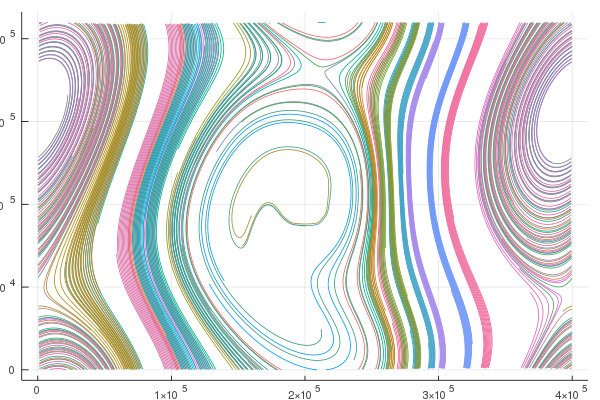

In [5]:
df_from_mitgcm=read_flt(joinpath(p,"../examples/flt_example/"),Float32)
plt=PlotBasic(df_from_mitgcm,40,100000.0)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*